In [3]:
from google.colab import files
print("Upload your kaggle.json (Kaggle -> Settings -> API -> Create New Token)")
uploaded = files.upload()

import os
os.makedirs("/root/.kaggle", exist_ok=True)
!mv kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

Upload your kaggle.json (Kaggle -> Settings -> API -> Create New Token)


Saving kaggle.json to kaggle.json


In [4]:
!pip install -q kaggle
!kaggle datasets download -d adityajn105/flickr8k -p /content --unzip

DATA_ROOT = "/content"
IMG_DIR = os.path.join(DATA_ROOT, "Images")
print("Num images:", len(os.listdir(IMG_DIR)))
print("captions.txt exists:", os.path.exists(os.path.join(DATA_ROOT, "captions.txt")))

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
100% 1.04G/1.04G [00:09<00:00, 119MB/s] 

Num images: 8091
captions.txt exists: True


In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split

captions_df = pd.read_csv(os.path.join(DATA_ROOT, "captions.txt"))
captions_df = captions_df.rename(columns={"image": "filename"})

unique_images = captions_df["filename"].unique()
train_images, test_images = train_test_split(unique_images, test_size=0.15, random_state=42)
print(f"Train images: {len(train_images)} | Test images: {len(test_images)}")

# Train: keep all 5 captions per image (free data augmentation)
train_df = captions_df[captions_df["filename"].isin(train_images)][["filename", "caption"]].reset_index(drop=True)

# Test: keep only 1 caption per image (fast, non-redundant evaluation)
test_df = (
    captions_df[captions_df["filename"].isin(test_images)]
    .groupby("filename", as_index=False)
    .first()[["filename", "caption"]]
)
print(f"train.csv rows: {len(train_df)} | test.csv rows: {len(test_df)}")

os.makedirs("/content/dataset/flickr8k", exist_ok=True)
train_csv_path = "/content/dataset/flickr8k/train.csv"
test_csv_path = "/content/dataset/flickr8k/test.csv"
train_df.to_csv(train_csv_path, index=False)
test_df.to_csv(test_csv_path, index=False)

train_df.head()

Train images: 6877 | Test images: 1214
train.csv rows: 34385 | test.csv rows: 1214


,filename,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [6]:
import torch
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [7]:
!pip install -q torch transformers gdown rouge-score evaluate nltk opencv-python-headless pandas tqdm scikit-learn

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.5 MB/s eta 0:00:00


In [8]:
from transformers import (
    AutoModel,
    AutoImageProcessor,
    GPT2Config,
    AutoTokenizer,
    AutoModelForCausalLM
)

In [9]:
class ImageCaptionModel(nn.Module):
    def __init__(self, encoder_name="WinKawaks/vit-small-patch16-224", decoder_name="distilgpt2"):
        super().__init__()

        self.encoder = AutoModel.from_pretrained(encoder_name)
        self.feature_extractor = AutoImageProcessor.from_pretrained(encoder_name)
        for param in self.encoder.parameters():
            param.requires_grad = False

        config = GPT2Config.from_pretrained(decoder_name)
        config.add_cross_attention = True
        self.decoder = AutoModelForCausalLM.from_pretrained(
            decoder_name, config=config, attn_implementation="eager"
        )

        self.projection = nn.Linear(self.encoder.config.hidden_size, self.decoder.config.n_embd)
        self.tokenizer = AutoTokenizer.from_pretrained(decoder_name)
        self.tokenizer.pad_token = self.tokenizer.eos_token

    def forward(self, images, decoder_input_ids):
        with torch.no_grad():
            encoder_outputs = self.encoder(pixel_values=images)
        patch_embeddings = encoder_outputs.last_hidden_state[:, 1:, :]
        projected_embeds = self.projection(patch_embeddings)
        outputs = self.decoder(input_ids=decoder_input_ids, encoder_hidden_states=projected_embeds)
        return outputs.logits

In [10]:
model = ImageCaptionModel().to(device)
processor = model.feature_extractor
tokenizer = model.tokenizer

dummy_images = torch.randn(2, 3, 224, 224).to(device)
dummy_caption_ids = torch.randint(0, tokenizer.vocab_size, (2, 10)).to(device)

logits = model(dummy_images, dummy_caption_ids)
print("Logits shape:", logits.shape)   # expect (2, 10, vocab_size)

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 88.2MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

[transformers] ViTModel LOAD REPORT from: WinKawaks/vit-small-patch16-224
Key                 | Status     | 
--------------------+------------+-
classifier.weight   | UNEXPECTED | 
classifier.bias     | UNEXPECTED | 
pooler.dense.weight | MISSING    | 
pooler.dense.bias   | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/762 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  353MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

[transformers] GPT2LMHeadModel LOAD REPORT from: distilgpt2
Key                                                           | Status  | 
--------------------------------------------------------------+---------+-
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_proj.bias   | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.ln_cross_attn.weight         | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.ln_cross_attn.bias           | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_attn.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_attn.bias   | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_proj.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.q_attn.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.q_attn.bias   | MISSING | 

Notes:
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Logits shape: torch.Size([2, 10, 50257])


In [11]:
from torch.utils.data import Dataset
from PIL import Image
import pandas as pd

class CaptionDataset(Dataset):
    def __init__(self, csv_path, img_dir, tokenizer, processor, max_length=40):
        self.df = pd.read_csv(csv_path)
        self.img_dir = img_dir
        self.tokenizer = tokenizer
        self.processor = processor
        self.max_length = max_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = f"{self.img_dir}/{row['filename']}"

        # Load and preprocess the image
        image = Image.open(image_path).convert("RGB")
        pixel_values = self.processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)

        # Tokenize the caption, with an end-of-sentence token so the model learns when to stop
        caption = row["caption"] + self.tokenizer.eos_token
        encoding = self.tokenizer(
            caption,
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )
        input_ids = encoding["input_ids"].squeeze(0)
        attention_mask = encoding["attention_mask"].squeeze(0)

        return pixel_values, input_ids, attention_mask

In [12]:
from torch.nn.utils.rnn import pad_sequence

def collate_fn(batch):
    pixel_values, input_ids, attention_masks = zip(*batch)

    pixel_values = torch.stack(pixel_values)  # images are already same size, just stack them
    input_ids = pad_sequence(input_ids, batch_first=True, padding_value=tokenizer.pad_token_id)
    attention_masks = pad_sequence(attention_masks, batch_first=True, padding_value=0)

    return pixel_values, input_ids, attention_masks

In [13]:
from torch.utils.data import DataLoader
from functools import partial

train_dataset = CaptionDataset(train_csv_path, IMG_DIR, tokenizer, processor)
test_dataset = CaptionDataset(test_csv_path, IMG_DIR, tokenizer, processor)

BATCH_SIZE = 32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

print(f"Train batches: {len(train_loader)} | Test batches: {len(test_loader)}")

Train batches: 1075 | Test batches: 38


In [14]:
pixel_values, input_ids, attention_masks = next(iter(train_loader))
print("pixel_values:", pixel_values.shape)
print("input_ids:", input_ids.shape)
print("attention_masks:", attention_masks.shape)

pixel_values: torch.Size([32, 3, 224, 224])
input_ids: torch.Size([32, 29])
attention_masks: torch.Size([32, 29])


In [15]:
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-5, weight_decay=0.01)
loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id, label_smoothing=0.1)

In [16]:
from tqdm import tqdm

def train_one_epoch(model, loader, optimizer, loss_fn, device, scheduler=None):
    model.train()
    total_loss = 0

    for pixel_values, input_ids, attention_masks in tqdm(loader):
        pixel_values = pixel_values.to(device)
        input_ids = input_ids.to(device)

        decoder_input_ids = input_ids[:, :-1]
        labels = input_ids[:, 1:]

        optimizer.zero_grad()
        logits = model(pixel_values, decoder_input_ids)
        loss = loss_fn(logits.reshape(-1, logits.size(-1)), labels.reshape(-1))
        loss.backward()
        optimizer.step()

        if scheduler is not None:
            scheduler.step()

        total_loss += loss.item()

    return total_loss / len(loader)

In [17]:
from sklearn.model_selection import train_test_split

# Split by unique image again, same reasoning as Day 1's train/test split
train_only_images, val_images = train_test_split(train_images, test_size=0.1, random_state=42)

train_only_df = train_df[train_df["filename"].isin(train_only_images)].reset_index(drop=True)
val_df = train_df[train_df["filename"].isin(val_images)].groupby("filename", as_index=False).first()[["filename", "caption"]]

train_only_csv = "/content/dataset/flickr8k/train_only.csv"
val_csv = "/content/dataset/flickr8k/val.csv"
train_only_df.to_csv(train_only_csv, index=False)
val_df.to_csv(val_csv, index=False)

print(f"Train-only rows: {len(train_only_df)} | Val rows: {len(val_df)}")

train_dataset = CaptionDataset(train_only_csv, IMG_DIR, tokenizer, processor)
val_dataset = CaptionDataset(val_csv, IMG_DIR, tokenizer, processor)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

Train-only rows: 30945 | Val rows: 688


In [18]:
def evaluate(model, loader, loss_fn, device):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for pixel_values, input_ids, attention_masks in tqdm(loader):
            pixel_values = pixel_values.to(device)
            input_ids = input_ids.to(device)

            decoder_input_ids = input_ids[:, :-1]
            labels = input_ids[:, 1:]

            logits = model(pixel_values, decoder_input_ids)
            loss = loss_fn(logits.reshape(-1, logits.size(-1)), labels.reshape(-1))

            total_loss += loss.item()

    return total_loss / len(loader)

In [ ]:
from transformers import get_linear_schedule_with_warmup

# Fresh model + optimizer, as before
model = ImageCaptionModel().to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-5)   # lowered from 5e-5

NUM_EPOCHS = 15
PATIENCE = 3

total_steps = len(train_loader) * NUM_EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=int(0.1 * total_steps),   # warm up over the first 10% of training
    num_training_steps=total_steps
)

best_val_loss = float("inf")
epochs_without_improvement = 0
history = {"train_loss": [], "val_loss": []}

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

    train_loss = train_one_epoch(model, train_loader, optimizer, loss_fn, device, scheduler=scheduler)
    val_loss = evaluate(model, val_loader, loss_fn, device)

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    print(f"Train loss: {train_loss:.4f} | Val loss: {val_loss:.4f} | LR: {scheduler.get_last_lr()[0]:.2e}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_without_improvement = 0
        torch.save(model.state_dict(), "/content/best_model.pt")
        print("Saved new best model.")
    else:
        epochs_without_improvement += 1
        print(f"No improvement for {epochs_without_improvement} epoch(s).")

    if epochs_without_improvement >= PATIENCE:
        print(f"\nEarly stopping triggered after epoch {epoch+1}.")
        break

Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

[transformers] ViTModel LOAD REPORT from: WinKawaks/vit-small-patch16-224
Key                 | Status     | 
--------------------+------------+-
classifier.weight   | UNEXPECTED | 
classifier.bias     | UNEXPECTED | 
pooler.dense.weight | MISSING    | 
pooler.dense.bias   | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

[transformers] GPT2LMHeadModel LOAD REPORT from: distilgpt2
Key                                                           | Status  | 
--------------------------------------------------------------+---------+-
transformer.h.{0, 1, 2, 3, 4, 5}.ln_cross_attn.weight         | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_attn.bias   | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.ln_cross_attn.bias           | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_proj.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_proj.bias   | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_attn.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.q_attn.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.q_attn.bias   | MISSING | 

Notes:
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.



Epoch 1/15


100%|██████████| 22/22 [00:08<00:00,  2.47it/s]


Train loss: 5.2551 | Val loss: 4.2414 | LR: 2.00e-05
Saved new best model.

Epoch 2/15


100%|██████████| 22/22 [00:08<00:00,  2.48it/s]


Train loss: 4.1588 | Val loss: 3.9702 | LR: 2.89e-05
Saved new best model.

Epoch 3/15


100%|██████████| 22/22 [00:08<00:00,  2.53it/s]


Train loss: 3.8893 | Val loss: 3.8461 | LR: 2.67e-05
Saved new best model.

Epoch 4/15


100%|██████████| 22/22 [00:08<00:00,  2.56it/s]


Train loss: 3.7301 | Val loss: 3.8047 | LR: 2.44e-05
Saved new best model.

Epoch 5/15


100%|██████████| 22/22 [00:08<00:00,  2.53it/s]


Train loss: 3.6130 | Val loss: 3.7625 | LR: 2.22e-05
Saved new best model.

Epoch 6/15


100%|██████████| 22/22 [00:08<00:00,  2.56it/s]


Train loss: 3.5180 | Val loss: 3.7535 | LR: 2.00e-05
Saved new best model.

Epoch 7/15


100%|██████████| 22/22 [00:08<00:00,  2.50it/s]


Train loss: 3.4358 | Val loss: 3.7421 | LR: 1.78e-05
Saved new best model.

Epoch 8/15


100%|██████████| 22/22 [00:08<00:00,  2.52it/s]


Train loss: 3.3659 | Val loss: 3.7385 | LR: 1.56e-05
Saved new best model.

Epoch 9/15


100%|██████████| 22/22 [00:08<00:00,  2.48it/s]


Train loss: 3.3059 | Val loss: 3.7487 | LR: 1.33e-05
No improvement for 1 epoch(s).

Epoch 10/15


100%|██████████| 22/22 [00:08<00:00,  2.64it/s]


Train loss: 3.2524 | Val loss: 3.7540 | LR: 1.11e-05
No improvement for 2 epoch(s).

Epoch 11/15


100%|██████████| 22/22 [00:08<00:00,  2.47it/s]

Train loss: 3.2066 | Val loss: 3.7673 | LR: 8.89e-06
No improvement for 3 epoch(s).

Early stopping triggered after epoch 11.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.makedirs('/content/drive/MyDrive/image_captioning_checkpoints', exist_ok=True)

import shutil
shutil.copy('/content/best_model.pt', '/content/drive/MyDrive/image_captioning_checkpoints/best_model.pt')
print("Copied to Drive.")

Mounted at /content/drive
Copied to Drive.


In [22]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [23]:
import os
print(os.path.exists("/content/drive"))
print(os.path.exists("/content/drive/MyDrive/image_captioning_checkpoints/best_model.pt"))

True
True


In [24]:
model = ImageCaptionModel().to(device)
model.load_state_dict(torch.load("/content/drive/MyDrive/image_captioning_checkpoints/best_model.pt", map_location=device))
model.eval()

Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

[transformers] ViTModel LOAD REPORT from: WinKawaks/vit-small-patch16-224
Key                 | Status     | 
--------------------+------------+-
classifier.weight   | UNEXPECTED | 
classifier.bias     | UNEXPECTED | 
pooler.dense.weight | MISSING    | 
pooler.dense.bias   | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

[transformers] GPT2LMHeadModel LOAD REPORT from: distilgpt2
Key                                                           | Status  | 
--------------------------------------------------------------+---------+-
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_proj.bias   | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.ln_cross_attn.weight         | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.ln_cross_attn.bias           | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_attn.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_attn.bias   | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.c_proj.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.q_attn.weight | MISSING | 
transformer.h.{0, 1, 2, 3, 4, 5}.crossattention.q_attn.bias   | MISSING | 

Notes:
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


ImageCaptionModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (layers): ModuleList(
      (0-11): 12 x ViTLayer(
        (attention): ViTAttention(
          (q_proj): Linear(in_features=384, out_features=384, bias=True)
          (k_proj): Linear(in_features=384, out_features=384, bias=True)
          (v_proj): Linear(in_features=384, out_features=384, bias=True)
          (o_proj): Linear(in_features=384, out_features=384, bias=True)
        )
        (layernorm_before): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
        (layernorm_after): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
        (mlp): ViTMLP(
          (activation_fn): GELUActivation()
          (fc1): Linear(in_features=384, out_features=1536, bias=True)
          (fc2): Linear(in_features=1536, out_fea

In [30]:
def generate_caption_greedy(model, image, tokenizer, processor, device, max_length=30):
    model.eval()
    pixel_values = processor(images=image, return_tensors="pt")["pixel_values"].to(device)
    generated_ids = [tokenizer.bos_token_id or tokenizer.eos_token_id]

    with torch.no_grad():
        encoder_outputs = model.encoder(pixel_values=pixel_values)
        patch_embeddings = encoder_outputs.last_hidden_state[:, 1:, :]
        encoder_hidden_states = model.projection(patch_embeddings)

        repeat_count = 0
        for _ in range(max_length):
            input_ids = torch.tensor([generated_ids]).to(device)
            outputs = model.decoder(input_ids=input_ids, encoder_hidden_states=encoder_hidden_states)
            next_token_logits = outputs.logits[0, -1, :]
            next_token_id = torch.argmax(next_token_logits).item()

            if next_token_id == tokenizer.eos_token_id:
                break

            # If the model just repeats the same token twice in a row, treat that as "it's stuck" and stop
            if generated_ids and next_token_id == generated_ids[-1]:
                repeat_count += 1
                if repeat_count >= 2:
                    break
            else:
                repeat_count = 0

            generated_ids.append(next_token_id)

    return tokenizer.decode(generated_ids, skip_special_tokens=True)

Ground truth:  A couple and an infant , being held by the male , sitting next to a pond with a near by stroller .
Greedy:         man and woman are looking into a camera . one is holding a camera . one is holding a camera . one is holding a camera . one is holding
Beam search:    man and woman are sitting on a bench with their backs to the camera . one of them is wearing a black hat . another is holding a camera


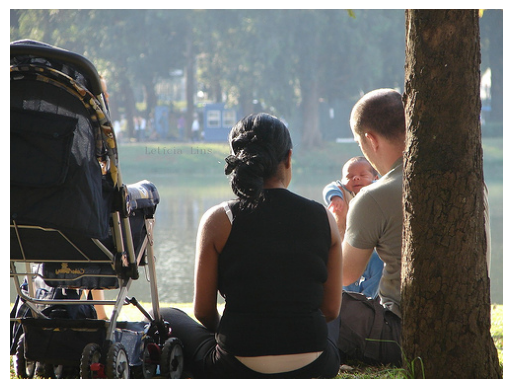

In [31]:
import matplotlib.pyplot as plt
from PIL import Image
import torch

# Load sample
sample_row = test_dataset.df.iloc[0]
sample_image = Image.open(f"{IMG_DIR}/{sample_row['filename']}").convert("RGB")

# Greedy caption
greedy_caption = generate_caption_greedy(
    model, sample_image, tokenizer, processor, device
)

# Beam search (using transformers' built-in generate)
num_beams = 4
pixel_values = processor(images=sample_image, return_tensors="pt")["pixel_values"].to(device)

with torch.no_grad():
    encoder_outputs = model.encoder(pixel_values=pixel_values)
    patch_embeddings = encoder_outputs.last_hidden_state[:, 1:, :]
    encoder_hidden_states = model.projection(patch_embeddings)
    # no manual repeat_interleave — pass it at batch size 1
beam_output = model.decoder.generate(
    input_ids=torch.tensor([[tokenizer.bos_token_id or tokenizer.eos_token_id]]).to(device),
    encoder_hidden_states=encoder_hidden_states,
    num_beams=4,
    max_length=30,
    eos_token_id=tokenizer.eos_token_id,
    early_stopping=True,
    no_repeat_ngram_size=2,
    repetition_penalty=1.5,
    length_penalty=0.6     # push harder toward shorter, more focused captions
)
beam_caption = tokenizer.decode(beam_output[0], skip_special_tokens=True)

# Print results
print("Ground truth: ", sample_row["caption"])
print("Greedy:       ", greedy_caption)
print("Beam search:  ", beam_caption)

# Show image
plt.imshow(sample_image)
plt.axis("off")
plt.show()

In [40]:
def generate_captions_for_dataset(model, df, img_dir, tokenizer, processor, device, method="beam", max_length=30):
    results = []
    for idx in tqdm(range(len(df))):
        row = df.iloc[idx]
        image = Image.open(f"{img_dir}/{row['filename']}").convert("RGB")

        if method == "greedy":
            caption = generate_caption_greedy(model, image, tokenizer, processor, device, max_length)
        else:
            pixel_values = processor(images=image, return_tensors="pt")["pixel_values"].to(device)
            with torch.no_grad():
                encoder_outputs = model.encoder(pixel_values=pixel_values)
                patch_embeddings = encoder_outputs.last_hidden_state[:, 1:, :]
                encoder_hidden_states = model.projection(patch_embeddings)
                beam_output = model.decoder.generate(
                    input_ids=torch.tensor([[tokenizer.bos_token_id or tokenizer.eos_token_id]]).to(device),
                    encoder_hidden_states=encoder_hidden_states,
                    num_beams=4,
                    max_length=max_length,
                    eos_token_id=tokenizer.eos_token_id,
                    early_stopping=True,
                    no_repeat_ngram_size=2,
                    repetition_penalty=1.5
                )
            caption = tokenizer.decode(beam_output[0], skip_special_tokens=True)

        results.append({"filename": row["filename"], "ground_truth": row["caption"], "generated": caption})
    return pd.DataFrame(results)

test_df_gen = generate_captions_for_dataset(model, test_dataset.df, IMG_DIR, tokenizer, processor, device, method="beam")
test_df_gen.head()

100%|██████████| 1214/1214 [08:52<00:00,  2.28it/s]


,filename,ground_truth,generated
0,1022454428_b6b660a67b.jpg,"A couple and an infant , being held by the mal...",man and woman are sitting on a bench with the...
1,102351840_323e3de834.jpg,A man drilling a hole in the ice .,snowboarder in the middle of a frozen lake . ...
2,1028205764_7e8df9a2ea.jpg,A man and a baby are in a yellow kayak on water .,woman in a yellow kayak paddles down the wate...
3,103195344_5d2dc613a3.jpg,A man in black is sitting next to a modern art...,man on a skateboard in front of a building . ...
4,104136873_5b5d41be75.jpg,People sit on the mountainside and check out t...,group of people sitting on a hill overlooking...


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [41]:
print(len(test_df_gen))


1214


In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
from rouge_score import rouge_scorer
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
from nltk.tokenize import word_tokenize

rouge = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
smoothing = SmoothingFunction().method1  # avoids BLEU scoring 0 on short captions with no 4-gram overlap

bleu_scores, rouge1_scores, rouge2_scores, rougeL_scores, meteor_scores = [], [], [], [], []

for _, row in tqdm(test_df_gen.iterrows(), total=len(test_df_gen)):
    reference = row["ground_truth"]
    hypothesis = row["generated"]

    ref_tokens = word_tokenize(reference.lower())
    hyp_tokens = word_tokenize(hypothesis.lower())

    bleu = sentence_bleu([ref_tokens], hyp_tokens, smoothing_function=smoothing)
    bleu_scores.append(bleu)

    rouge_result = rouge.score(reference, hypothesis)
    rouge1_scores.append(rouge_result['rouge1'].fmeasure)
    rouge2_scores.append(rouge_result['rouge2'].fmeasure)
    rougeL_scores.append(rouge_result['rougeL'].fmeasure)

    meteor = meteor_score([ref_tokens], hyp_tokens)
    meteor_scores.append(meteor)

print(f"BLEU:    {sum(bleu_scores)/len(bleu_scores):.4f}")
print(f"ROUGE-1: {sum(rouge1_scores)/len(rouge1_scores):.4f}")
print(f"ROUGE-2: {sum(rouge2_scores)/len(rouge2_scores):.4f}")
print(f"ROUGE-L: {sum(rougeL_scores)/len(rougeL_scores):.4f}")
print(f"METEOR:  {sum(meteor_scores)/len(meteor_scores):.4f}")

100%|██████████| 1214/1214 [00:06<00:00, 191.17it/s]

BLEU:    0.0348
ROUGE-1: 0.3065
ROUGE-2: 0.0916
ROUGE-L: 0.2356
METEOR:  0.3064


In [42]:
from transformers import AutoProcessor, AutoModelForImageTextToText

smolvlm_processor = AutoProcessor.from_pretrained("HuggingFaceTB/SmolVLM-256M-Instruct")
smolvlm_model = AutoModelForImageTextToText.from_pretrained(
    "HuggingFaceTB/SmolVLM-256M-Instruct",
    torch_dtype=torch.bfloat16
).to(device)
smolvlm_model.eval()

processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/429 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/486 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/7.35k [00:00<?, ?B/s]

[transformers] Model config: pad_token_id must be `None` or an integer within the vocabulary (between 0 and 31999), got 128002. This may result in unexpected behavior.


tokenizer_config.json:   0%|          | 0.00/28.2k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/801k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/466k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/4.74k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/1.07k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors: reconstructing file:   0%|          |  0.00B /  513MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/471 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/136 [00:00<?, ?B/s]

Idefics3ForConditionalGeneration(
  (model): Idefics3Model(
    (vision_model): Idefics3VisionTransformer(
      (embeddings): Idefics3VisionEmbeddings(
        (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), padding=valid)
        (position_embedding): Embedding(1024, 768)
      )
      (encoder): Idefics3Encoder(
        (layers): ModuleList(
          (0-11): 12 x Idefics3EncoderLayer(
            (self_attn): Idefics3VisionAttention(
              (k_proj): Linear(in_features=768, out_features=768, bias=True)
              (v_proj): Linear(in_features=768, out_features=768, bias=True)
              (q_proj): Linear(in_features=768, out_features=768, bias=True)
              (out_proj): Linear(in_features=768, out_features=768, bias=True)
            )
            (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
            (mlp): Idefics3VisionMLP(
              (activation_fn): GELUTanh()
              (fc1): Linear(in_features=768, out

In [43]:
def generate_smolvlm_caption(image, processor, model, device, prompt="Describe this image in one short, plain sentence, like a photo caption."):
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image"},
                {"type": "text", "text": prompt}
            ]
        }
    ]
    text_prompt = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=text_prompt, images=[image], return_tensors="pt").to(device)

    with torch.no_grad():
       generated_ids = model.generate(**inputs, max_new_tokens=60)

    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    # The output includes the prompt; keep only the model's actual answer
    caption = generated_text.split("Assistant:")[-1].strip()
    return caption

sample_row = test_dataset.df.iloc[0]
sample_image = Image.open(f"{IMG_DIR}/{sample_row['filename']}").convert("RGB")
print("Ground truth: ", sample_row["caption"])
print("SmolVLM:      ", generate_smolvlm_caption(sample_image, smolvlm_processor, smolvlm_model, device))

Ground truth:  A couple and an infant , being held by the male , sitting next to a pond with a near by stroller .
SmolVLM:       In this image we can see a woman sitting on the ground and holding a baby in her hands. There is a baby in the baby carrier. There is a tree trunk. There is a water body. There are trees. There is a building.


In [44]:
smolvlm_results = []
for idx in tqdm(range(len(test_dataset.df))):
    row = test_dataset.df.iloc[idx]
    image = Image.open(f"{IMG_DIR}/{row['filename']}").convert("RGB")
    caption = generate_smolvlm_caption(image, smolvlm_processor, smolvlm_model, device)
    smolvlm_results.append({"filename": row["filename"], "ground_truth": row["caption"], "generated": caption})

smolvlm_df = pd.DataFrame(smolvlm_results)
smolvlm_df.head()

100%|██████████| 1214/1214 [1:12:39<00:00,  3.59s/it]


,filename,ground_truth,generated
0,1022454428_b6b660a67b.jpg,"A couple and an infant , being held by the mal...",In this image we can see a woman sitting on th...
1,102351840_323e3de834.jpg,A man drilling a hole in the ice .,In this image we can see a person standing on ...
2,1028205764_7e8df9a2ea.jpg,A man and a baby are in a yellow kayak on water .,In this image we can see a person sitting in a...
3,103195344_5d2dc613a3.jpg,A man in black is sitting next to a modern art...,In this image we can see a sculpture. In the b...
4,104136873_5b5d41be75.jpg,People sit on the mountainside and check out t...,In this image we can see a person standing on ...


In [45]:
test_df_gen.to_csv("/content/drive/MyDrive/image_captioning_checkpoints/test_df_gen.csv", index=False)
smolvlm_df.to_csv("/content/drive/MyDrive/image_captioning_checkpoints/smolvlm_df.csv", index=False)
print("Saved both to Drive.")

Saved both to Drive.


In [ ]:
def compute_metrics(df):
    bleu_scores, rouge1_scores, rouge2_scores, rougeL_scores, meteor_scores = [], [], [], [], []

    for _, row in df.iterrows():
        ref_tokens = word_tokenize(row["ground_truth"].lower())
        hyp_tokens = word_tokenize(row["generated"].lower())

        bleu_scores.append(sentence_bleu([ref_tokens], hyp_tokens, smoothing_function=smoothing))
        rouge_result = rouge.score(row["ground_truth"], row["generated"])
        rouge1_scores.append(rouge_result['rouge1'].fmeasure)
        rouge2_scores.append(rouge_result['rouge2'].fmeasure)
        rougeL_scores.append(rouge_result['rougeL'].fmeasure)
        meteor_scores.append(meteor_score([ref_tokens], hyp_tokens))

    return {
        "BLEU": sum(bleu_scores)/len(bleu_scores),
        "ROUGE-1": sum(rouge1_scores)/len(rouge1_scores),
        "ROUGE-2": sum(rouge2_scores)/len(rouge2_scores),
        "ROUGE-L": sum(rougeL_scores)/len(rougeL_scores),
        "METEOR": sum(meteor_scores)/len(meteor_scores),
    }

our_model_metrics = compute_metrics(test_df_gen)
smolvlm_metrics = compute_metrics(smolvlm_df)

comparison = pd.DataFrame([our_model_metrics, smolvlm_metrics], index=["Our Model", "SmolVLM (zero-shot)"])
comparison

,BLEU,ROUGE-1,ROUGE-2,ROUGE-L,METEOR
Our Model,0.034775,0.306526,0.091611,0.235617,0.306381
SmolVLM (zero-shot),0.024953,0.240824,0.055902,0.207098,0.247931


Generated:  man  and  woman  are  sitting  on  a  bench  with  their  backs  to  the  camera  .  one  of  them  is  holding


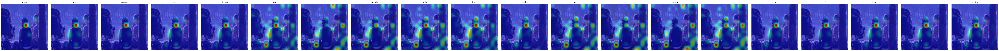

In [32]:
import torch.nn.functional as F

def generate_with_attention_beam(model, image, tokenizer, processor, device, max_length=20, num_beams=4):
    model.eval()
    pixel_values = processor(images=image, return_tensors="pt")["pixel_values"].to(device)

    with torch.no_grad():
        encoder_outputs = model.encoder(pixel_values=pixel_values)
        patch_embeddings = encoder_outputs.last_hidden_state[:, 1:, :]
        encoder_hidden_states = model.projection(patch_embeddings)

        start_token = tokenizer.bos_token_id or tokenizer.eos_token_id
        # Each beam: (token_ids list, cumulative log-prob score, list of attention maps, finished flag)
        beams = [{"ids": [start_token], "score": 0.0, "attn_maps": [], "finished": False}]

        for _ in range(max_length):
            candidates = []

            for beam in beams:
                if beam["finished"]:
                    candidates.append(beam)   # keep finished beams as-is, don't extend them further
                    continue

                input_ids = torch.tensor([beam["ids"]]).to(device)
                outputs = model.decoder(
                    input_ids=input_ids,
                    encoder_hidden_states=encoder_hidden_states,
                    output_attentions=True
                )

                last_layer_attn = outputs.cross_attentions[-1][0]
                attn_for_next_token = last_layer_attn[:, -1, :].mean(dim=0).cpu().numpy()

                log_probs = F.log_softmax(outputs.logits[0, -1, :], dim=-1)
                top_log_probs, top_ids = torch.topk(log_probs, num_beams)

                for lp, tid in zip(top_log_probs.tolist(), top_ids.tolist()):
                    new_ids = beam["ids"] + [tid]
                    new_score = beam["score"] + lp
                    new_attn_maps = beam["attn_maps"] + [attn_for_next_token]
                    finished = (tid == tokenizer.eos_token_id)
                    candidates.append({"ids": new_ids, "score": new_score, "attn_maps": new_attn_maps, "finished": finished})

            # Length-normalized score so beam search doesn't just favor short sequences
            candidates.sort(key=lambda b: b["score"] / len(b["ids"]), reverse=True)
            beams = candidates[:num_beams]

            if all(b["finished"] for b in beams):
                break

        best_beam = max(beams, key=lambda b: b["score"] / len(b["ids"]))

    words = [tokenizer.decode([tid]) for tid in best_beam["ids"][1:]]  # skip start token
    return words, best_beam["attn_maps"]


sample_row = test_dataset.df.iloc[0]
sample_image = Image.open(f"{IMG_DIR}/{sample_row['filename']}").convert("RGB")
words, attention_maps = generate_with_attention_beam(model, sample_image, tokenizer, processor, device, num_beams=4)

print("Generated:", " ".join(words))
visualize_attention(sample_image, words, attention_maps, max_words=len(words))

Generated:  man  and  woman  are  sitting  on  a  bench  with  their  backs  to  the  camera  .  one  of  them  is  holding


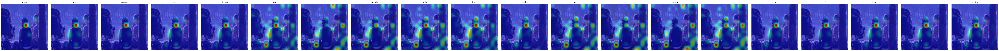

In [34]:
import matplotlib.pyplot as plt
import cv2

def visualize_attention(image, words, attention_maps, max_words=None):
    if max_words is None:
        max_words = len(words)
    image_np = np.array(image.resize((224, 224)))
    n = min(len(words), max_words)

    fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))
    if n == 1:
        axes = [axes]

    for i in range(n):
        attn = attention_maps[i].reshape(14, 14)
        attn = cv2.resize(attn, (224, 224), interpolation=cv2.INTER_CUBIC)
        attn = (attn - attn.min()) / (attn.max() - attn.min() + 1e-8)

        axes[i].imshow(image_np)
        axes[i].imshow(attn, cmap="jet", alpha=0.5)
        axes[i].set_title(words[i].strip())
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

sample_row = test_dataset.df.iloc[0]
sample_image = Image.open(f"{IMG_DIR}/{sample_row['filename']}").convert("RGB")
words, attention_maps = generate_with_attention_beam(model, sample_image, tokenizer, processor, device, num_beams=4)

print("Generated:", " ".join(words))
visualize_attention(sample_image, words, attention_maps)


--- Image: 102351840_323e3de834.jpg ---
Ground truth: A man drilling a hole in the ice .
Generated:     snow board er  in  the  middle  of  a  snow  covered  hill  .  two  people  are  standing  in  the  middle  of


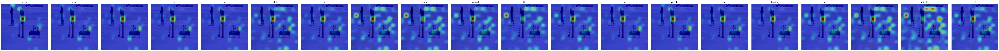


--- Image: 1028205764_7e8df9a2ea.jpg ---
Ground truth: A man and a baby are in a yellow kayak on water .
Generated:     girl  in  a  yellow  kay ak  padd les  down  the  water  .  .  while  another  girl  looks  on  .  .


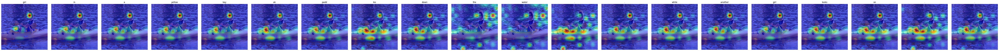

In [36]:
comparison_indices = [1, 2]  # ice-hole drilling image, kayak image — both hallucinated earlier

for idx in comparison_indices:
    row = test_dataset.df.iloc[idx]
    image = Image.open(f"{IMG_DIR}/{row['filename']}").convert("RGB")

    words, attention_maps = generate_with_attention_beam(model, image, tokenizer, processor, device)

    print(f"\n--- Image: {row['filename']} ---")
    print("Ground truth:", row["caption"])
    print("Generated:   ", " ".join(words))
    visualize_attention(image, words, attention_maps)

In [26]:
import numpy as np
from PIL import ImageFilter, ImageEnhance

def apply_occlusion(image, severity):
    """severity: fraction of image area to black out, e.g. 0.1, 0.5, 0.8"""
    img = image.copy()
    w, h = img.size
    box_area = severity * w * h
    box_side = int(box_area ** 0.5)
    x = np.random.randint(0, max(1, w - box_side))
    y = np.random.randint(0, max(1, h - box_side))
    pixels = np.array(img)
    pixels[y:y+box_side, x:x+box_side] = 0
    return Image.fromarray(pixels)

def apply_blur(image, severity):
    """severity: blur radius, e.g. 2, 5, 10"""
    return image.filter(ImageFilter.GaussianBlur(radius=severity))

def apply_rotation(image, severity):
    """severity: degrees, e.g. 10, 30, 45"""
    return image.rotate(severity, fillcolor=(0, 0, 0))

def apply_color_distortion(image, severity):
    """severity: 0 = normal, higher = more washed out / dark, e.g. 0.3, 0.6, 0.9"""
    enhancer = ImageEnhance.Brightness(image)
    img = enhancer.enhance(1 - severity)   # darken as severity increases
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(1 - severity * 0.5)
    return img

In [ ]:
corruption_functions = {
    "occlusion": apply_occlusion,
    "blur": apply_blur,
    "rotation": apply_rotation,
    "color_distortion": apply_color_distortion,
}

severity_levels = {
    "occlusion": [0.1, 0.5, 0.8],
    "blur": [2, 5, 10],
    "rotation": [10, 30, 45],
    "color_distortion": [0.3, 0.6, 0.9],
}

# Use a smaller sample for speed -- full 1214 images x 4 corruptions x 3 severities = 14,568 generations, too slow
robustness_sample = test_dataset.df.sample(n=200, random_state=42).reset_index(drop=True)

robustness_results = []

for corruption_name, corruption_fn in corruption_functions.items():
    for severity in severity_levels[corruption_name]:
        rows = []
        for _, row in tqdm(robustness_sample.iterrows(), total=len(robustness_sample), desc=f"{corruption_name} @ {severity}"):
            image = Image.open(f"{IMG_DIR}/{row['filename']}").convert("RGB")
            corrupted_image = corruption_fn(image, severity)

            pixel_values = processor(images=corrupted_image, return_tensors="pt")["pixel_values"].to(device)
            with torch.no_grad():
                encoder_outputs = model.encoder(pixel_values=pixel_values)
                patch_embeddings = encoder_outputs.last_hidden_state[:, 1:, :]
                encoder_hidden_states = model.projection(patch_embeddings)
                beam_output = model.decoder.generate(
                    input_ids=torch.tensor([[tokenizer.bos_token_id or tokenizer.eos_token_id]]).to(device),
                    encoder_hidden_states=encoder_hidden_states,
                    num_beams=4, max_length=35, eos_token_id=tokenizer.eos_token_id,
                    early_stopping=True, no_repeat_ngram_size=2, repetition_penalty=1.5, length_penalty=0.6
                )
            caption = tokenizer.decode(beam_output[0], skip_special_tokens=True)
            rows.append({"filename": row["filename"], "ground_truth": row["caption"], "generated": caption})

        metrics = compute_metrics(pd.DataFrame(rows))
        metrics["corruption"] = corruption_name
        metrics["severity"] = severity
        robustness_results.append(metrics)

# Add the clean (no corruption) baseline for comparison
clean_metrics = compute_metrics(test_df_gen)
clean_metrics["corruption"] = "none"
clean_metrics["severity"] = 0
robustness_results.append(clean_metrics)

robustness_df = pd.DataFrame(robustness_results)
robustness_df

color_distortion @ 0.9: 100%|██████████| 200/200 [01:43<00:00,  1.93it/s]


,BLEU,ROUGE-1,ROUGE-2,ROUGE-L,METEOR,corruption,severity
0,0.032092,0.281936,0.082076,0.216728,0.299783,occlusion,0.1
1,0.023049,0.243727,0.057365,0.185615,0.254907,occlusion,0.5
2,0.017679,0.225333,0.044754,0.172752,0.230298,occlusion,0.8
3,0.028534,0.283781,0.079072,0.213990,0.292024,blur,2.0
4,0.024294,0.263336,0.071443,0.200466,0.283171,blur,5.0
5,0.018934,0.240077,0.052939,0.183496,0.245456,blur,10.0
6,0.030848,0.286049,0.085598,0.212668,0.306218,rotation,10.0
7,0.028378,0.280842,0.077767,0.210844,0.288317,rotation,30.0
8,0.025118,0.271234,0.067734,0.203937,0.284500,rotation,45.0
9,0.028010,0.286126,0.080953,0.214676,0.295345,color_distortion,0.3


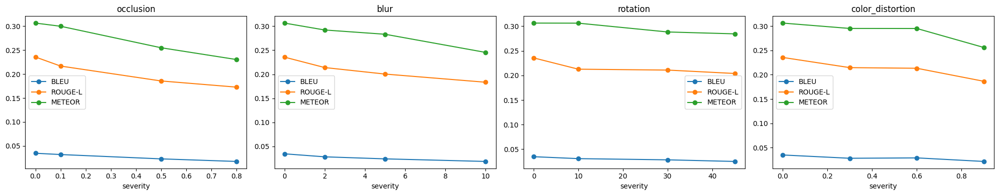

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 4, figsize=(20, 4))
metrics_to_plot = ["BLEU", "ROUGE-L", "METEOR"]
corruption_order = ["occlusion", "blur", "rotation", "color_distortion"]

clean_row = robustness_df[robustness_df["corruption"] == "none"].iloc[0]

for ax, corruption in zip(axes, corruption_order):
    subset = robustness_df[robustness_df["corruption"] == corruption].sort_values("severity")

    for metric in metrics_to_plot:
        severities = [0] + subset["severity"].tolist()
        values = [clean_row[metric]] + subset[metric].tolist()
        ax.plot(severities, values, marker="o", label=metric)

    ax.set_title(corruption)
    ax.set_xlabel("severity")
    ax.legend()

plt.tight_layout()
plt.show()

Ground truth: A couple and an infant , being held by the male , sitting next to a pond with a near by stroller .
Generated:     man  wearing  a  black  hat  is  standing  in  front  of  a  tree  with  a  bicycle  in  the  background  .  a


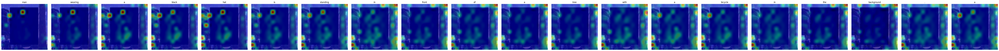

In [37]:
sample_row = test_dataset.df.iloc[0]
sample_image = Image.open(f"{IMG_DIR}/{sample_row['filename']}").convert("RGB")

occluded_image = apply_occlusion(sample_image, severity=0.5)

words, attention_maps = generate_with_attention_beam(model, occluded_image, tokenizer, processor, device)

print("Ground truth:", sample_row["caption"])
print("Generated:   ", " ".join(words))
visualize_attention(occluded_image, words, attention_maps, max_words=len(words))

In [46]:
our_captions = test_df_gen[["generated"]].copy()
our_captions["label"] = 1   # 1 = our model

smolvlm_captions = smolvlm_df[["generated"]].copy()
smolvlm_captions["label"] = 0   # 0 = SmolVLM

classifier_df = pd.concat([our_captions, smolvlm_captions], ignore_index=True)
classifier_df = classifier_df.sample(frac=1, random_state=42).reset_index(drop=True)   # shuffle

print(classifier_df["label"].value_counts())
classifier_df.head()

label
1    1214
0    1214
Name: count, dtype: int64


,generated,label
0,dog running on the grass with a ball in its m...,1
1,woman in a black and white coat standing in f...,1
2,skateboarder in the middle of a busy city str...,1
3,boy on a swing in the sand . one is wearing a...,1
4,In this image we can see a dog on the ground. ...,0


In [47]:
from sklearn.model_selection import train_test_split

train_texts, test_texts, train_labels, test_labels = train_test_split(
    classifier_df["generated"].tolist(),
    classifier_df["label"].tolist(),
    test_size=0.2,
    stratify=classifier_df["label"],
    random_state=42
)
print(f"Train: {len(train_texts)} | Test: {len(test_texts)}")

Train: 1942 | Test: 486


In [48]:
from transformers import AutoTokenizer as BertTokenizer, AutoModelForSequenceClassification

bert_tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = AutoModelForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2).to(device)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  440MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertForSequenceClassification LOAD REPORT from: bert-base-uncased
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
classifier.weight                          | MISSING    | 
classifier.bias                            | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [49]:
train_encodings = bert_tokenizer(train_texts, truncation=True, padding=True, max_length=64, return_tensors="pt")
test_encodings = bert_tokenizer(test_texts, truncation=True, padding=True, max_length=64, return_tensors="pt")

In [50]:
class ClassifierDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])
        return item

train_clf_dataset = ClassifierDataset(train_encodings, train_labels)
test_clf_dataset = ClassifierDataset(test_encodings, test_labels)

train_clf_loader = DataLoader(train_clf_dataset, batch_size=16, shuffle=True)
test_clf_loader = DataLoader(test_clf_dataset, batch_size=16, shuffle=False)

In [51]:
bert_optimizer = torch.optim.AdamW(bert_model.parameters(), lr=2e-5)

def train_classifier_epoch(model, loader, optimizer, device):
    model.train()
    total_loss, correct = 0, 0
    for batch in tqdm(loader):
        batch = {k: v.to(device) for k, v in batch.items()}
        optimizer.zero_grad()
        outputs = model(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        correct += (outputs.logits.argmax(dim=-1) == batch["labels"]).sum().item()
    return total_loss / len(loader), correct / len(loader.dataset)

for epoch in range(3):
    train_loss, train_acc = train_classifier_epoch(bert_model, train_clf_loader, bert_optimizer, device)
    print(f"Epoch {epoch+1}: loss={train_loss:.4f}, accuracy={train_acc:.4f}")

100%|██████████| 122/122 [00:26<00:00,  4.52it/s]


Epoch 1: loss=0.0617, accuracy=0.9866


100%|██████████| 122/122 [00:26<00:00,  4.60it/s]


Epoch 2: loss=0.0013, accuracy=1.0000


100%|██████████| 122/122 [00:25<00:00,  4.72it/s]

Epoch 3: loss=0.0006, accuracy=1.0000


In [52]:
bert_model.eval()
correct = 0
with torch.no_grad():
    for batch in test_clf_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = bert_model(**batch)
        correct += (outputs.logits.argmax(dim=-1) == batch["labels"]).sum().item()

print(f"Test accuracy: {correct / len(test_clf_dataset):.4f}")

Test accuracy: 0.9979


In [53]:
bert_model.eval()
wrong_examples = []
with torch.no_grad():
    for i, batch in enumerate(test_clf_loader):
        batch_gpu = {k: v.to(device) for k, v in batch.items()}
        outputs = bert_model(**batch_gpu)
        preds = outputs.logits.argmax(dim=-1)
        for j in range(len(preds)):
            if preds[j] != batch["labels"][j]:
                text = bert_tokenizer.decode(batch["input_ids"][j], skip_special_tokens=True)
                wrong_examples.append({"text": text, "true_label": batch["labels"][j].item(), "predicted": preds[j].item()})

print(f"Misclassified: {len(wrong_examples)}")
for ex in wrong_examples:
    print(ex)

Misclassified: 1
{'text': 'a small child is standing on the floor in a room.', 'true_label': 0, 'predicted': 1}
